In [ ]:
pip install tensorflow==2.14.0

In [5]:
import numpy as np
import pandas as pd
import cv2
from matplotlib import pyplot as plt
import os
import shutil
import seaborn as sns
from tqdm import tqdm
from collections import Counter
import random
from functools import reduce
import functools 
import tensorflow as tf
import keras
from keras import datasets, layers, models
import pathlib
import graphviz
from IPython.display import clear_output

import lightgbm as lgb
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.decomposition import PCA
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report

print(tf.__version__)

2.14.0


# Proportion of leaf pixels in images.

In [ ]:
segmented_path = '/kaggle/input/plantvillage-dataset/segmented/'
directories = sorted(os.listdir(segmented_path))
proportion_of_colored_pxl_per_class = []

# Compute the proportion of colored pixels by images.
for directory in directories:
    
    proportion_of_colored_pxl_per_image = []
    print(directory)
    class_path = os.path.join(segmented_path, directory)
        
    for image in tqdm(os.scandir(class_path)):      
        
        image = os.path.join(class_path, image)
        
        # Reading the image in 2 dimensions only because we just need to count the colored pixels.
        image = cv2.imread(image, 0)
        image = cv2.resize(image, (256, 256)) 
        
        # Dividing the number of colored pixels by the total number of pixels.
        proportion_of_colored_pxl_per_image.append(np.count_nonzero(image) / (65536)) # 256 * 256 = 65536
        
    proportion_of_colored_pxl_per_class.append(proportion_of_colored_pxl_per_image)

In [7]:
# Get the statistics of the proportion of colored pixels per class.
a = []
for i in proportion_of_colored_pxl_per_class:
    a+=i
proportion_of_colored_pxl_per_images = pd.Series(a)
proportion_of_colored_pxl_per_images.describe()

count    54306.000000
mean         0.507015
std          0.153888
min          0.000000
25%          0.414642
50%          0.498268
75%          0.575130
max          1.000000
dtype: float64

In [8]:
df2 = pd.DataFrame(data=proportion_of_colored_pxl_per_class).T
df2.columns = directories
df2_describe = df2.describe().T
df2_describe.to_csv("proportion_of_colored_pxl_per_class_for_the_segmented_images.csv")
df2_describe

# 75% of images in a class have a proportion of colored pixels greater than the value in the "25%" column.
# The "count" column is the number of images in the class.

,count,mean,std,min,25%,50%,75%,max
Apple___Apple_scab,630.0,0.547298,0.101305,0.260681,0.476044,0.544449,0.616474,0.899597
Apple___Black_rot,621.0,0.486016,0.066410,0.300064,0.440811,0.481018,0.531845,0.666092
Apple___Cedar_apple_rust,275.0,0.436881,0.092660,0.201157,0.356636,0.442215,0.505440,0.663345
Apple___healthy,1645.0,0.437317,0.084339,0.153748,0.380753,0.441269,0.495346,0.733429
Blueberry___healthy,1502.0,0.371904,0.092137,0.066422,0.301693,0.368408,0.437119,0.990036
Cherry_(including_sour)___Powdery_mildew,1052.0,0.493439,0.076457,0.284271,0.449993,0.500153,0.538254,0.998474
Cherry_(including_sour)___healthy,854.0,0.481013,0.081288,0.281616,0.425026,0.479904,0.539902,0.993942
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot,513.0,0.757941,0.110593,0.328400,0.695343,0.765976,0.833908,1.000000
Corn_(maize)___Common_rust_,1192.0,0.791397,0.146824,0.338211,0.682182,0.780708,0.977333,0.994308
Corn_(maize)___Northern_Leaf_Blight,985.0,0.726966,0.174904,0.188812,0.605331,0.748734,0.862839,1.000000


# intensity histogram

In [ ]:
segmented_path = '/kaggle/input/plantvillage-dataset/segmented/'
directories = sorted(os.listdir(segmented_path))
list_of_hist = []

# Compute the intensity histograms for the RGB color space by categories.
for directory in directories:
    
    # Create a numpy array for one class. Where intensity ranges from 0 to 255 and for the 3 channels.
    hist_intensity = np.zeros((256, 1, 3))
    print(directory)
    class_path = segmented_path + directory
    nbr_images = len(os.listdir(class_path))
    
    # Iterating through the images of a class.
    for image in tqdm(os.scandir(class_path)):      
        
        image = os.path.join(class_path, image)
        image = cv2.imread(image)
        
        # Accumulating each channel intensity histogram in its associated dimension in the array.
        hist_intensity[:,:,0] += cv2.calcHist([image],[0],None,[256],[0,256]) # For red.
        hist_intensity[:,:,1] += cv2.calcHist([image],[1],None,[256],[0,256]) # For Green.
        hist_intensity[:,:,2] += cv2.calcHist([image],[2],None,[256],[0,256]) # For Blue.
        
    list_of_hist.append(hist_intensity/nbr_images)

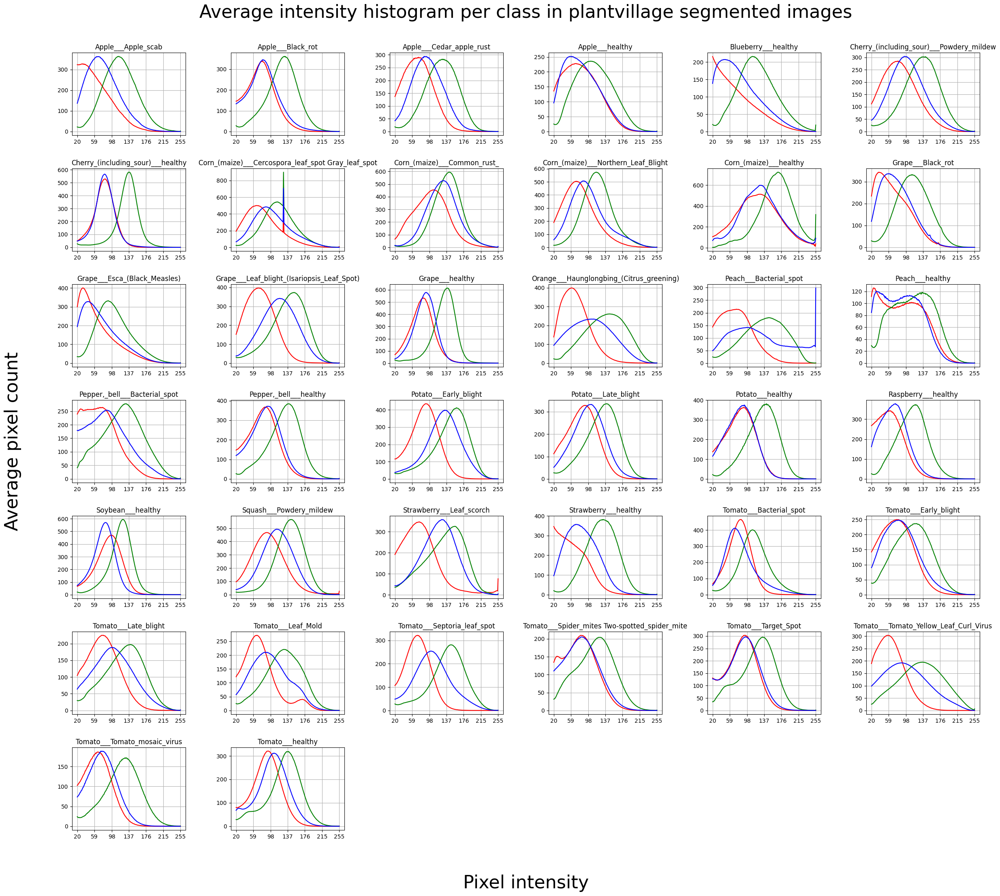

In [10]:
fig, axs = plt.subplots(7,6, figsize=(7*4, 6*4))
axs = axs.ravel()
plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.9,
                    top=0.9,
                    wspace=0.4,
                    hspace=0.4)

fig.suptitle("Average intensity histogram per class in plantvillage segmented images", fontsize=32, y=0.95)
for i, (hist, plant_class) in enumerate(zip(list_of_hist, directories)):
    
    # Omit intensities from 0 to 20 as they represent the background in segmented images.
    # This may cause a bias in prediction, given the size of the leaf in the image.
    axs[i].plot(hist[:,:,0][20:], color='r')
    axs[i].plot(hist[:,:,1][20:], color='g')
    axs[i].plot(hist[:,:,2][20:], color='b')
    axs[i].set_title(plant_class, fontsize=12)
    axs[i].grid(visible=True)
    axs[i].set_xticks(np.linspace(0, 255-20, 7), labels=np.linspace(20, 255, 7).astype(int))
    
for i in [38, 39, 40, 41]:
    fig.delaxes(axs[i])

fig.text(0.5, 0.04, 'Pixel intensity', ha='center', fontsize=32)
fig.text(0.04, 0.5, 'Average pixel count', va='center', rotation='vertical', fontsize=32)
plt.show() 

fig = axs[0].get_figure()
fig.savefig('plantvillage segmented average intensity histogram per class.png', bbox_inches = 'tight')

# Distribution of images by categories and species in the plantvillage-dataset and new-plant-diseases-dataset

In [11]:
# plantvillage-dataset
plantvillage_path = '/kaggle/input/plantvillage-dataset/color/'
directories = sorted(os.listdir(plantvillage_path))
plantvillage_count = []

for directory in directories:

    class_path = plantvillage_path + directory
    plantvillage_count.append(len(os.listdir(class_path)))
        
plantvillage_df = pd.DataFrame(list(zip(directories, plantvillage_count)),
                               columns = ['labels', 'image count'])

plantvillage_df['species'] = plantvillage_df['labels'].str.split(pat="_", n=1, expand=True)[0].str.replace(',', '')
plantvillage_df = plantvillage_df.sort_values(by=['species'])

# new-plant-diseases-dataset
new_plant_diseases_path = '/kaggle/input/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/'
new_plant_diseases_train_count, new_plant_diseases_valid_count = [], []

for subset, subset_count in [('train', new_plant_diseases_train_count),
                             ('valid', new_plant_diseases_valid_count)]:
    
    for directory in sorted(directories):
        
        class_path = new_plant_diseases_path + subset + '/' + directory
        subset_count.append(len(os.listdir(class_path)))
        
new_plant_diseases_df = pd.DataFrame(list(zip(directories, new_plant_diseases_train_count, new_plant_diseases_valid_count)),
                                     columns = ['labels', 'new plant diseases train image count', 'new plant diseases valid image count'])

new_plant_diseases_df['new plant diseases total count'] = new_plant_diseases_df['new plant diseases train image count'] + new_plant_diseases_df['new plant diseases valid image count']
new_plant_diseases_df['species'] = new_plant_diseases_df['labels'].str.split(pat="_", n=1, expand=True)[0].str.replace(',', '')
new_plant_diseases_df = new_plant_diseases_df.sort_values(by=['species'])

df = new_plant_diseases_df
df['plantvillage_df image count'] = plantvillage_df['image count']
df = df.sort_values(by=['plantvillage_df image count'])
display(df.head())

df_grouped = df.groupby(['species']).sum().sort_values(by=['plantvillage_df image count'])
display(df_grouped.head())

,labels,new plant diseases train image count,new plant diseases valid image count,new plant diseases total count,species,plantvillage_df image count
22,Potato___healthy,1824,456,2280,Potato,152
2,Apple___Cedar_apple_rust,1760,440,2200,Apple,275
17,Peach___healthy,1728,432,2160,Peach,360
23,Raspberry___healthy,1781,445,2226,Raspberry,371
36,Tomato___Tomato_mosaic_virus,1790,448,2238,Tomato,373


,labels,new plant diseases train image count,new plant diseases valid image count,new plant diseases total count,plantvillage_df image count
species,,,,,
Raspberry,Raspberry___healthy,1781,445,2226,371
Blueberry,Blueberry___healthy,1816,454,2270,1502
Strawberry,Strawberry___healthyStrawberry___Leaf_scorch,3598,900,4498,1565
Squash,Squash___Powdery_mildew,1736,434,2170,1835
Cherry,Cherry_(including_sour)___healthyCherry_(inclu...,3509,877,4386,1906


In [12]:
# Checking that the counts are good.
for directory in directories:
    
    a = len(os.listdir(plantvillage_path + directory))
    b = len(os.listdir(new_plant_diseases_path + 'train' + '/' + directory))
    c = len(os.listdir(new_plant_diseases_path + 'valid' + '/' + directory))
    
    d = df['plantvillage_df image count'][df['labels'] == directory].values[0]
    e = df['new plant diseases train image count'][df['labels'] == directory].values[0]
    f = df['new plant diseases valid image count'][df['labels'] == directory].values[0]
            
    assert a == d and b == e and c == f
    print(a, d, '  ', b, e, '  ', c, f, '   ', directory)

630 630    2016 2016    504 504     Apple___Apple_scab
621 621    1987 1987    497 497     Apple___Black_rot
275 275    1760 1760    440 440     Apple___Cedar_apple_rust
1645 1645    2008 2008    502 502     Apple___healthy
1502 1502    1816 1816    454 454     Blueberry___healthy
1052 1052    1683 1683    421 421     Cherry_(including_sour)___Powdery_mildew
854 854    1826 1826    456 456     Cherry_(including_sour)___healthy
513 513    1642 1642    410 410     Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot
1192 1192    1907 1907    477 477     Corn_(maize)___Common_rust_
985 985    1908 1908    477 477     Corn_(maize)___Northern_Leaf_Blight
1162 1162    1859 1859    465 465     Corn_(maize)___healthy
1180 1180    1888 1888    472 472     Grape___Black_rot
1383 1383    1920 1920    480 480     Grape___Esca_(Black_Measles)
1076 1076    1722 1722    430 430     Grape___Leaf_blight_(Isariopsis_Leaf_Spot)
423 423    1692 1692    423 423     Grape___healthy
5507 5507    2010 2010    5

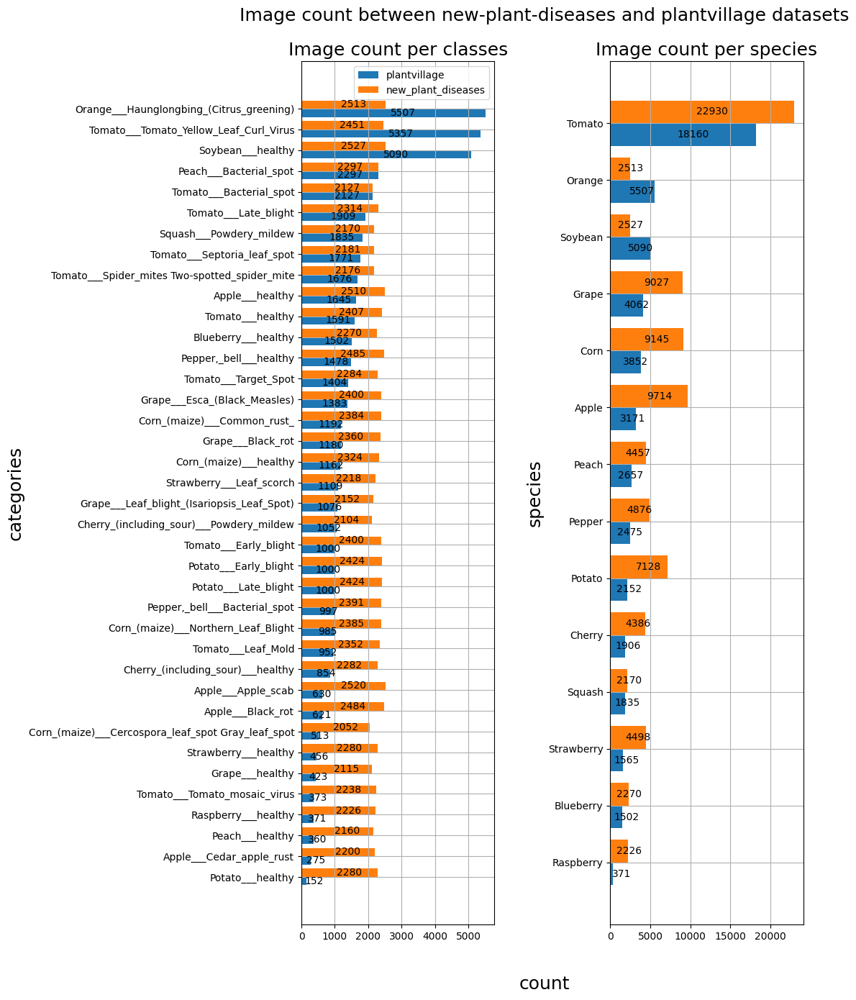

In [13]:
fig, axs = plt.subplots(1,2,figsize=(9,15))
plt.subplots_adjust(bottom=0.1,
                    top=0.9, 
                    wspace=0.6)

fig.suptitle("Image count between new-plant-diseases and plantvillage datasets", fontsize=18, y=0.95)

axs[0].set_title("Image count per classes", fontsize=18)

axs[0].barh(np.arange(38) - 0.2, df['plantvillage_df image count'].values, height=0.4,
        label = 'plantvillage')

axs[0].barh(np.arange(38) + 0.2, df['new plant diseases total count'].values, height=0.4,
        label = 'new_plant_diseases')

axs[0].bar_label(axs[0].containers[0], fontsize=10, label_type='center', padding=10)
axs[0].bar_label(axs[0].containers[1], fontsize=10, label_type='center', padding=10)

axs[0].set_yticks(np.arange(38), df['labels'])
axs[0].grid(visible=True)
axs[0].set_ylabel('categories', fontsize=18)
axs[0].legend()



axs[1].set_title("Image count per species", fontsize=18)

axs[1].barh(np.arange(len(df_grouped.index)) - 0.2, df_grouped['plantvillage_df image count'].values, height=0.4,
        label = 'plantvillage')
axs[1].barh(np.arange(len(df_grouped.index)) + 0.2, df_grouped['new plant diseases total count'].values, height=0.4,
        label = 'new_plant_diseases')

axs[1].bar_label(axs[1].containers[0], fontsize=10, label_type='center', padding=10)
axs[1].bar_label(axs[1].containers[1], fontsize=10, label_type='center', padding=10)

axs[1].grid(visible=True)
axs[1].set_yticks(np.arange(14), df_grouped.index)
axs[1].set_ylabel('species', fontsize=18)

fig.text(0.5, 0.04, 'count', ha='center', fontsize=18)
plt.show()

fig = axs[0].get_figure()
fig.savefig('Image count per classes and species between new-plant-diseases and plantvillage datasets.png', bbox_inches = 'tight')

# Display a grid of images

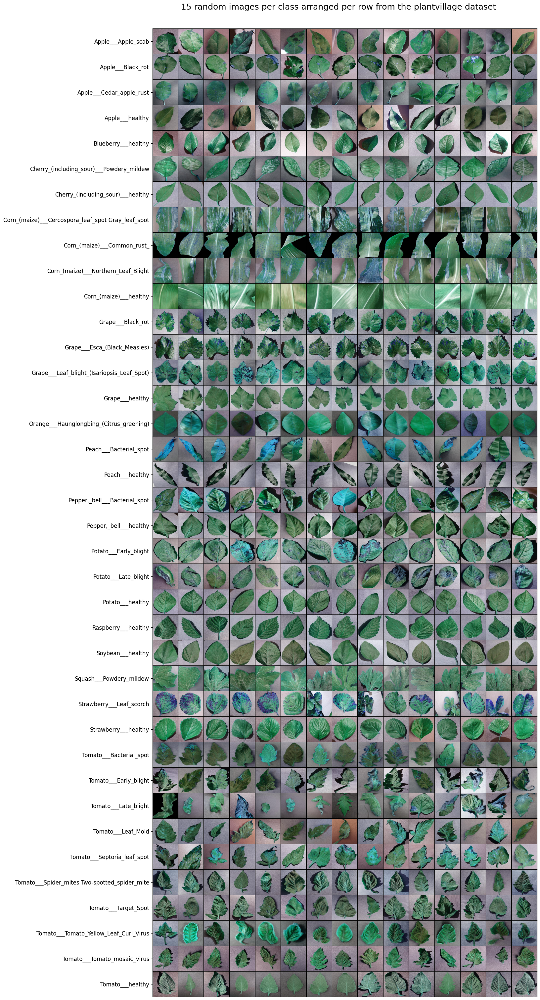

In [14]:
plantvillage_path = '/kaggle/input/plantvillage-dataset/color/'
directories = sorted(os.listdir(plantvillage_path))
images_by_row = 15

fig, axs = plt.subplots(38, images_by_row, figsize=(images_by_row, 38))
axs = axs.ravel()
fig.subplots_adjust(hspace=0, wspace=0)
fig.suptitle(f"{images_by_row} random images per class arranged per row from the plantvillage dataset", fontsize=18, y=0.9)

j=0
for row, directory in enumerate(directories):
    
    for i in range(images_by_row):
    
        path = plantvillage_path + directory

        image_list = os.listdir(path)
        random_im = random.choice(image_list)
        image_list.remove(random_im)

        im = cv2.imread(path + '/' + random_im)
        axs[i+j].imshow(im)
        axs[i+j].set_xticks([])
        
        if i+j == images_by_row * row:
            axs[i+j].set_yticks([128], labels=[directory], fontsize=12)
        else:
            axs[i+j].set_yticks([])
            
    j+=images_by_row
    
plt.show()
fig = axs[0].get_figure()
fig.savefig(f"{images_by_row} images per class arranged per row from the plantvillage dataset.png", bbox_inches = 'tight')

# Creation of the histograms

The formulas of the transformation are detailed  in the opencv documentation: https://docs.opencv.org/3.2.0/de/d25/imgproc_color_conversions.html.

The value range of the different dimensions are :

    COLOR_BGR2HSV --> [180, 255, 255] for H, S an V respectively.
    COLOR_BGR2Lab --> [255, 255 255]
    COLOR_BGR2HLS --> [180, 255, 255]
    
Originally H ranges from 0 to 360 degrees but it can't be encoded in an 8-bit encoded image. 8-bit can only encodes 256 values.

https://docs.opencv.org/3.4/d8/dbc/tutorial_histogram_calculation.html

In [ ]:
# Data will have for each row an image and for each column a value of the color space dimension.
# This code takes about 10 minutes to complete.
segmented_path = '/kaggle/input/plantvillage-dataset/segmented/'

# Classes are sorted.
directories = sorted(os.listdir(segmented_path))

# Each sublists are associated to 1 color space.
# 1 sublist will contain all the values for all channels for all the images.
value_proportion_by_color_space_by_image = [[], [], [], [], []]

# Creating a list that will store the label for each image.
labels = []

for directory in directories:
    
    print(directory)
    class_path = segmented_path + directory
    
    # Fill in the list based on the number of images in the class.
    labels += [directory] * len(os.listdir(class_path))

    for image in tqdm(os.scandir(class_path)): 
        
        image_path = os.path.join(class_path, image)
        
        # Converting the image in the different color spaces.
        BGR_image = cv2.imread(image_path)
        
        # If the image contains less than 75*75 colored pixels, skip it.
        if np.count_nonzero(BGR_image)<5625:
            
            # Remove the label for that image.
            labels.pop() 
            print("Image removed :", image_path)
            continue
                        
        if (BGR_image.shape[0], BGR_image.shape[1]) != (256, 256):
            BGR_image = cv2.resize(BGR_image, (256, 256))
            
        gray_image = cv2.cvtColor(BGR_image, cv2.COLOR_BGR2GRAY)[..., np.newaxis] # Add a dimension for the channel.
        HSV_image = cv2.cvtColor(BGR_image, cv2.COLOR_BGR2HSV)
        HLS_image = cv2.cvtColor(BGR_image, cv2.COLOR_BGR2HLS)
        LAB_image = cv2.cvtColor(BGR_image, cv2.COLOR_BGR2LAB)
        
        for color_space, image in enumerate([BGR_image, gray_image, HSV_image, HLS_image, LAB_image]):
            
            list_of_array_by_channel = []
                            
            # For each channel in the color space compute the histogram.
            for channel in range(image.shape[-1]):
            
                # If we are in the hue dimension, keep the pixels having a value of 0.
                if (color_space == 2 and channel == 0) or (color_space == 3 and channel == 0):
                    
                    a = cv2.calcHist([image], [channel], None, [256], [0,256])
                    assert a.shape == (256, 1), print(a.shape, image_path, plt.imshow(image))
                    b = 65536 # 256 * 256 = 65536
                    
                    # Assert the histogram accounts for all the pixels in the image.
                    assert a.sum() == 65536, plt.imshow(image)
                    
                # Else exclude the pixels with value to 0 to remove the background of the segmented image.
                else:
                    a = cv2.calcHist([image], [channel], None, [256], [0,256])[1:]
                    assert a.shape == (255, 1), print(a.shape)
                    
                    # Count non-zero pixels.
                    b = np.count_nonzero(image[:, :, channel])
                                            
                    assert 0 < b <= 65536, print(b, image_path, plt.imshow(image))
                    
                    # Assert that the count of the non-zero pixels is equal to the count of colored pixels in the histogram.
                    assert a.sum() == b, print(a, b, image_path, plt.imshow(image))
                    
                assert a.max() <= 65536 and a.min() >= 0
                
                # Rounding to 5 decimal gives us a precision down to the pixel.
                # Indeed, at most all pixels are colored giving b = 65536 and if a = 1.
                # Which result in a/b = 0,000015 for a proportion of 1 pixel in a value of a dimension.
                # Then we can save memory with float32 instead of the default float64.
                proportion = np.round(a/b, 5).astype(np.float32)
                assert proportion.shape == a.shape, print(a.shape, proportion.shape, image_path, plt.imshow(image))
                assert proportion.max() <= 1 and proportion.min() >= 0, print(proportion, a, b)
                
                # The operation a / b transforms the count of values in the histogram to proportions.
                # It is the proportion of each value in the images.
                list_of_array_by_channel.append(proportion)
                    
            # Flatten and append in a list, the channels histograms of the color space.
            all_channels_of_one_color_space_for_one_image = [value_proportion[0] 
                                                             for channel in list_of_array_by_channel
                                                             for value_proportion in channel]
            
            # Append the list in the associated color space.
            value_proportion_by_color_space_by_image[color_space].append(all_channels_of_one_color_space_for_one_image)

In [ ]:
# Create the dataframe of histograms.

# Fiting a LabelEncoder on the directory names.
# Encoding starts from 0 to 38 in sorted order of directories.
le = LabelEncoder()
le.fit(directories)

color_space_labels = [["r", "g", "b"], "w", ["h", "s", "v"], ["h", "l", "s"], ["l*", "a*", "b*"]]
list_of_df = []

# The histogram variable below represents the list of histograms for all images and for all channels in 1 color space.
for histogram, channel_labels in tqdm(list(zip(value_proportion_by_color_space_by_image,
                                               color_space_labels))):
    
    print(channel_labels)
        
    # Set the dataframe column names. We remove background pixels with value to 0 because it is a biased feature.
    # It depends on the area of the leaf in the image and not on the specificity of the leaf itself.
    columns = [channel + "_" + str(value) for channel in channel_labels
               for value in range(0 if channel == "h" else 1, 256)]
    
    df = pd.DataFrame(histogram, columns=columns).fillna(0)
    
    # Add the label column with the previously populated "labels" list.
    df["labels"] = labels
    df["encoded_labels"] = le.transform(labels)
    
    # Consequently, df is the dataframe of histograms for all images and for one color space.
    # We have one dataframe by color space. 
    list_of_df.append(df)
    display(df.head())

# Verify that hue and saturation values are different between HSV and HLS color spaces.
hsv, hls, lab = list_of_df[2], list_of_df[3], list_of_df[4]

if all(hsv.iloc[:, :256] == hls.iloc[:, :256]) and all(hsv.iloc[:, 256:511] == hls.iloc[:, 511:-2]):
    print("In the HSV and HLS color spaces dataframes, hue and saturation are equal.")
    
if not np.all(np.array(hls.iloc[:, 256:511]) == np.array(lab.iloc[:, :255])):
    print("In the HLS and LAB color spaces dataframes, the lightness values are not equal.")
    
lightness = hls.iloc[:, 256:511]

# Concatenation of the dataframes on the column axis.
df1 = pd.concat([lightness] + list_of_df[:3] + [list_of_df[-1]], axis=1)
lrgbwhsvlab_df = df1.iloc[:, :-2].drop(['labels', 'encoded_labels'], axis=1)
lrgbwhsvlab_df[['labels', 'encoded_labels']] = df1.iloc[:,-2:]

# Dropping columns where the sum is equal to 0.
a = lrgbwhsvlab_df.sum()
print("Number of columns having their sum equals to 0 :", len(a[a==0]))

lrgbwhsvlab_df = lrgbwhsvlab_df.drop(columns=list(a[a==0].index))

del hsv, hls, lightness, list_of_df

In [ ]:
# Add encoding for species only and, for healthy and diseased leaf.
def encode_health_status(class_name):
    if "healthy" in  class_name:
        return 0
    else:
        return 1
    
def encode_species(class_name):
    
    class_name=class_name.split('_')[0]
    
    if "Apple" in class_name:
        return 0
    elif "Blueberry" in class_name:
        return 1
    elif "Cherry" in class_name:
        return 2
    elif "Corn" in class_name:
        return 3
    elif "Grape" in class_name:
        return 4
    elif "Orange" in class_name:
        return 5
    elif "Peach" in class_name:
        return 6
    elif "Pepper" in class_name:
        return 7
    elif "Potato" in class_name:
        return 8
    elif "Raspberry" in class_name:
        return 9
    elif "Soybean" in class_name:
        return 10
    elif "Squash" in class_name:
        return 11
    elif "Strawberry" in class_name:
        return 12
    elif "Tomato" in class_name:
        return 13
    else :
        print(class_name)
        raise Exception("Class is unknown") 

In [ ]:
lrgbwhsvlab_df['specie_encoding'] = lrgbwhsvlab_df['labels'].apply(encode_species)
lrgbwhsvlab_df['disease_encoding'] = lrgbwhsvlab_df['labels'].apply(encode_health_status)

lrgbwhsvlab_df.to_csv("lrgbwhsvlab_segmented_image_color_space_dimension_histograms.csv")
display(lrgbwhsvlab_df.head())

# Loading data from the working directory.

In [ ]:
lrgbwhsvlab_df = pd.read_csv("/kaggle/working/lrgbwhsvlab_segmented_image_color_space_dimension_histograms.csv", index_col=0)
color_space_labels = ["lrgbwhsvlab"]
labels = lrgbwhsvlab_df["labels"]

y = lrgbwhsvlab_df["encoded_labels"]
X = lrgbwhsvlab_df.iloc[:,:-4]
lrgbwhsvlab_df.head()

# lightgbm model

In [3]:
def lgb_skf_classifier(X, y, n_splits, parameter_dict, exp_name,
                       target_names, early_stopping, categorical_feature="auto"):
    """
    Train a LGBMClassifier with a stratified k-fold.
    For each fold it will create a classification report, a confusion matix and the feature importance data.
    Then the classification report and the feature importance will be averaged over the folds.
    The confusion matrix will be accumulated over the folds.
    parameter_dict represents all parameters than can be set in a LGBMClassifier.
    """

    cwd = os.getcwd()
    
    if not os.path.exists(cwd + "/" + f"{exp_name}"):
        os.mkdir(cwd + "/" + f"{exp_name}")
    else:
        print(f"Files in the {cwd}/{exp_name} directerory will be overwritten.")
        
    skf = StratifiedKFold(n_splits=n_splits)
    
    classification_reports = []
    list_of_confusion_matrices = []
    feature_importance_list = []
    
    y = np.array(y)
    for i, (train_index, test_index) in tqdm(enumerate(skf.split(X, y))):

        X_train, y_train = X.iloc[train_index], y[train_index]
        X_test, y_test = X.iloc[test_index], y[test_index]

        bst = lgb.LGBMClassifier(**parameter_dict)
        
        bst.fit(X_train, y_train, callbacks=[lgb.early_stopping(stopping_rounds=early_stopping)],
                eval_set = (X_test, y_test), categorical_feature=categorical_feature)
        
        # Clear the cell output to save memory.
        clear_output()
        
        y_pred = bst.predict(X_test)

        report_df = pd.DataFrame(classification_report(y_test, y_pred,
                                                       target_names=target_names,
                                                       output_dict=True)).T
        classification_reports.append(report_df)

        list_of_confusion_matrices.append(pd.crosstab(y_test, y_pred,
                                                    rownames=['Actual'],
                                                    colnames=['Predicted']))

        # Save the feature importance associated with the feature names.
        feature_importance_list.append(bst.feature_importances_)
        feature_name_list = bst.feature_name_

    # Average the data in feature_importance_list and save it as a csv.
    feature_importances_df = pd.DataFrame(feature_importance_list).T
    feature_importances_df = feature_importances_df.sum(axis=1)/n_splits
    feature_importances_df = pd.DataFrame(feature_importances_df)
    feature_importances_df["feature_name"] = feature_name_list
    feature_importances_df.columns = ["feature_importances", "feature_name"]
    feature_importances_df["color_space"] = feature_importances_df["feature_name"].str.split("_").str[0]
    feature_importances_df.to_csv(f"{exp_name}_average_feature_importances_by_number_of_split_over_{n_splits}_skf.csv")

    # Average the classification reports and save it as a csv.
    averaged_classification_reports = functools.reduce(lambda x, y:  x+y, classification_reports) / n_splits
    averaged_classification_reports.to_csv(f"{exp_name}_lgb_averaged_classification_reports_over_{n_splits}_skf.csv")

    # Accumulate the confusion matrices and save it as a csv.
    confusion_matrix_over_skf = functools.reduce(lambda x, y:  x+y, list_of_confusion_matrices)
    confusion_matrix_over_skf.to_csv(f"{exp_name}_lgb_confusion_matrix_over_{n_splits}_skf.csv")

    # Save the model on the last fold.
    bst.booster_.save_model(f"{exp_name}_lgb_model.txt")
    
    # Move the CSV files to their associated experiment folder.
    for file in os.listdir(cwd):
        if exp_name + "_" in file:
            shutil.move(os.path.join(cwd, file), os.path.join(cwd, exp_name, file))

    
    # To load the model.
    # bst = lgb.Booster(model_file=f"{exp_name}.txt")


In [ ]:
# Train 3 models. First of all, the classification of species.
lgb_param = {"class_weight":"balanced",
             "n_estimators": 400,
             "n_jobs":-1,
             "metric":["auc_mu", "multi_error", "multi_logloss"],
             "importance_type":"split",
             "num_leaves":21,
             "learning_rate":0.05,
             "verbosity":2} # To 2 to avoid timeout after 40 minutes. Kindly close the output pan to save RAM.

n_splits = 5
early_stopping=20

directories = sorted(os.listdir('/kaggle/input/plantvillage-dataset/segmented/'))
class_name = set([directory.split('_')[0].replace(",", "")
                  for directory in directories]) # For encoding from 0 to 13 respectively.
class_name = sorted(list(class_name))

lgb_skf_classifier(X=X, y=lrgbwhsvlab_df['specie_encoding'],
                   n_splits=n_splits, parameter_dict=lgb_param,
                   exp_name="species_classification",
                   target_names=class_name, early_stopping=early_stopping)


# Secondly, with the same parameters we train a model for the classification of the 38 categories.
lgb_skf_classifier(X=X, y=y, n_splits=n_splits, parameter_dict=lgb_param,
                   exp_name="full_classification",
                   target_names=directories, early_stopping=early_stopping)


# Lastly, the binary classification of the healthy and diseased leaves.
lgb_param = {"class_weight":"balanced",
             "n_estimators": 400,
             "n_jobs":-1,
             "metric":["auc", "binary_error"],
             "importance_type":"split",
             "num_leaves":21,
             "learning_rate":0.05,
             "verbosity":2}

class_name = ["healthy", "diseased"] # For 0 and 1 respectively.
df = X
df["species_encoding"] = lrgbwhsvlab_df['specie_encoding']

lgb_skf_classifier(X=df, y=lrgbwhsvlab_df['disease_encoding'],
                   n_splits=n_splits, parameter_dict=lgb_param,
                   exp_name="healthy_classification",
                   target_names=class_name, early_stopping=early_stopping)

# Draw the classification reports, the confusions matrices and the feature importance histograms.

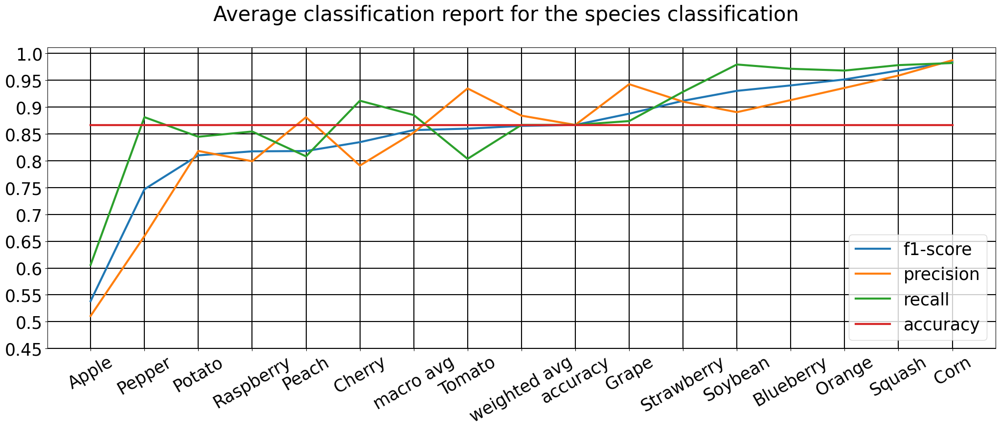

In [15]:
species_classification_lgb_averaged_classification_reports_over_5_skf = pd.read_csv("/kaggle/working/species_classification/species_classification_lgb_averaged_classification_reports_over_5_skf.csv", index_col=0)
data = species_classification_lgb_averaged_classification_reports_over_5_skf.sort_values(by=['f1-score'])

fig, ax = plt.subplots(figsize=(25, 8))
fig.suptitle("Average classification report for the species classification", fontsize=30, y=0.99)

ax.plot(range(17), data["f1-score"], label="f1-score", lw=3)
ax.plot(range(17), data["precision"], label="precision", lw=3)
ax.plot(range(17), data["recall"], label="recall", lw=3)
ax.plot(range(17), [data.loc["accuracy"][0]] * 17,label="accuracy", lw=3)

ax.legend(fontsize=25)
ax.grid(visible=True, axis='both', color="black", lw=1.5)

ax.set_yticks(np.round(np.arange(0.45, 1.01, 0.05), 2), labels=np.round(np.arange(0.45, 1.01, 0.05), 2), fontsize=25)

ax.set_xticks(range(17), labels=data.index, rotation=30, fontsize=25)
ax.yaxis.set_tick_params(labelsize=25)

plt.show()

fig = ax.get_figure()
fig.savefig('/kaggle/working/species_classification/species_classification_lgb_averaged_classification_reports_over_5_skf.png', bbox_inches='tight')

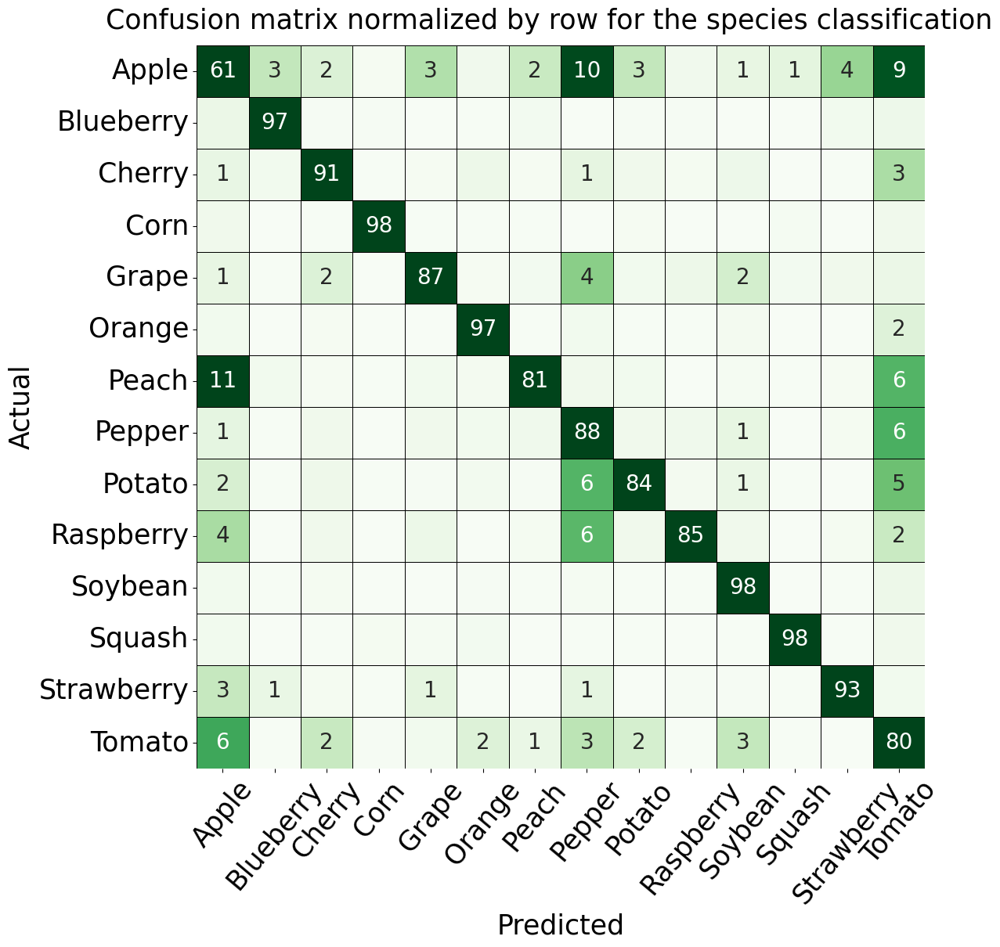

In [16]:
species_classification_confusion_matrix = pd.read_csv("/kaggle/working/species_classification/species_classification_lgb_confusion_matrix_over_5_skf.csv", index_col=0)
species_classification_normalized_by_row = species_classification_confusion_matrix.div(species_classification_confusion_matrix.sum(axis=1), axis=0)*100

directories = sorted(os.listdir('/kaggle/input/plantvillage-dataset/segmented/'))
class_name = set([directory.split('_')[0].replace(",", "") for directory in directories]) # From 0 and 13 respectively.

# It appeared that the order of a set of values is not conserved in the figure causing errors in the labels.
# In fact, the set is probably converted to a list by the set_yticklabels() function.
# The order of the list is different than the order of the set.
# So we create the list here and sort it again.
class_name = sorted(list(class_name))

fig, ax = plt.subplots(1, 1, figsize=(12, 12))
mask_annotation = np.array(species_classification_normalized_by_row >= 0.9)

fig.suptitle("Confusion matrix normalized by row for the species classification", fontsize=25, y=0.92)

sns.heatmap(species_classification_normalized_by_row, annot=True, cmap='Greens', vmin=0, vmax=10,
            cbar=False, linecolor="black", linewidths=0.5,
            fmt=".0f", annot_kws={"fontsize":20, "rotation":0})

for text, show_annot in zip(ax.texts, mask_annotation.ravel()):
    text.set_visible(show_annot)
    
ax.set_yticklabels(class_name, fontsize=25, rotation=0)
ax.set_xticklabels(class_name, fontsize=25, rotation=50)

ax.set_xlabel('Predicted', fontsize=25)
ax.set_ylabel('Actual', fontsize=25)

plt.show()

fig = ax.get_figure()
fig.savefig('/kaggle/working/species_classification/Species_classification_confusion_matrix_normalized_by_row_over_5_skf.png', bbox_inches='tight')

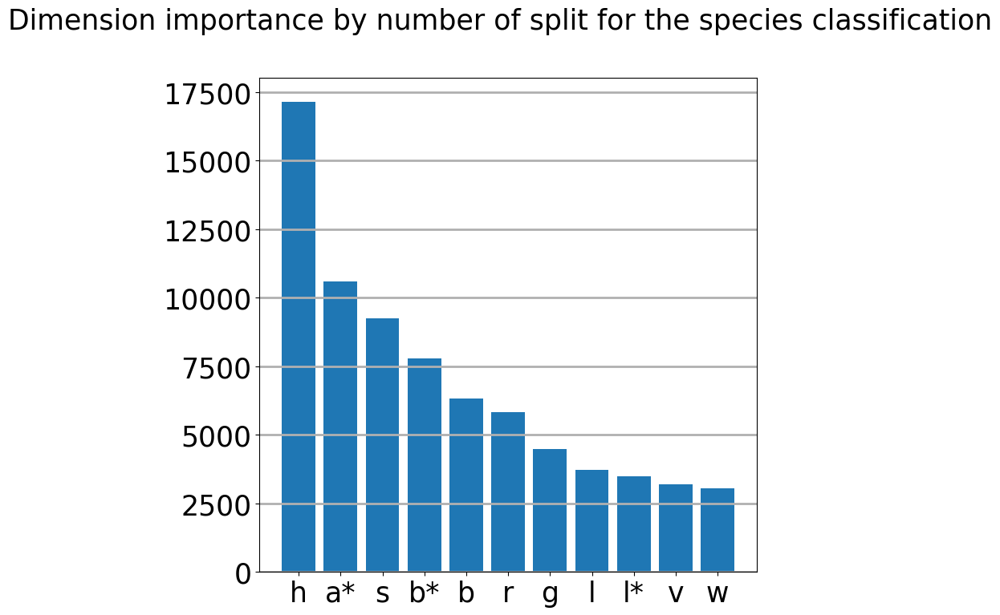

In [17]:
feature_importances_df = pd.read_csv("/kaggle/working/species_classification/species_classification_average_feature_importances_by_number_of_split_over_5_skf.csv", index_col=0)
feature_importances_df_grouped = feature_importances_df.groupby("color_space").sum().sort_values("feature_importances", ascending=False)

fig, ax = plt.subplots(figsize=(8, 8))
fig.suptitle("Dimension importance by number of split for the species classification", fontsize=25, y=0.99)

ax.bar(feature_importances_df_grouped["feature_importances"].index, feature_importances_df_grouped["feature_importances"])
ax.grid(visible=True, axis="y", lw=2)

ax.yaxis.set_tick_params(which='both', labelsize=25)
ax.xaxis.set_tick_params(labelsize=25)

plt.show()
fig = ax.get_figure()
fig.savefig('/kaggle/working/species_classification/species_classification_dimension_importance_by_number_of_split.png', bbox_inches='tight')

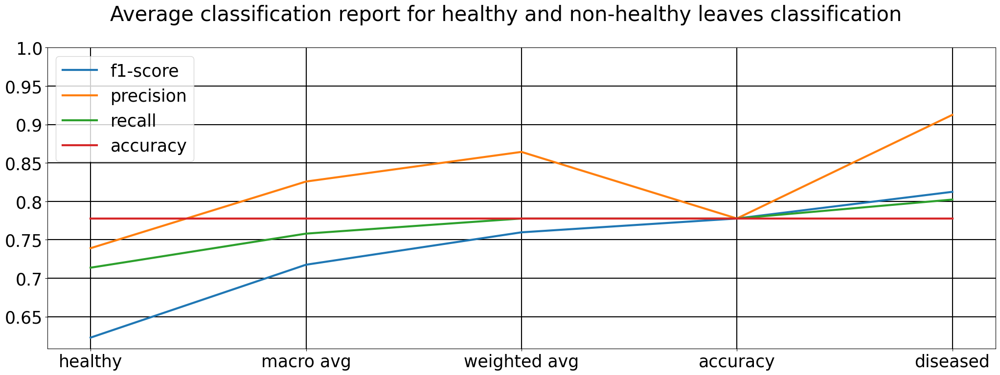

In [18]:
species_classification_lgb_averaged_classification_reports_over_5_skf = pd.read_csv("/kaggle/working/healthy_classification/healthy_classification_lgb_averaged_classification_reports_over_5_skf.csv", index_col=0)
data = species_classification_lgb_averaged_classification_reports_over_5_skf.sort_values(by=['f1-score'])

fig, ax = plt.subplots(figsize=(25, 8))
fig.suptitle("Average classification report for healthy and non-healthy leaves classification", fontsize=30, y=0.99)

ax.plot(range(5), data["f1-score"], label="f1-score", lw=3)
ax.plot(range(5), data["precision"], label="precision", lw=3)
ax.plot(range(5), data["recall"], label="recall", lw=3)
ax.plot(range(5), [data.loc["accuracy"][0]] * 5, label="accuracy", lw=3)

ax.legend(fontsize=25)
ax.grid(visible=True, axis='both', color="black", lw=1.5)

ax.set_yticks(np.round(np.arange(0.65, 1.01, 0.05), 2), labels=np.round(np.arange(0.65, 1.01, 0.05), 2), fontsize=25)

ax.set_xticks(range(5), labels=data.index, rotation=0, fontsize=25)
ax.yaxis.set_tick_params(labelsize=25)

plt.show()

fig = ax.get_figure()
fig.savefig('/kaggle/working/healthy_classification/healthy_classification_lgb_averaged_classification_reports_over_5_skf.png', bbox_inches='tight')

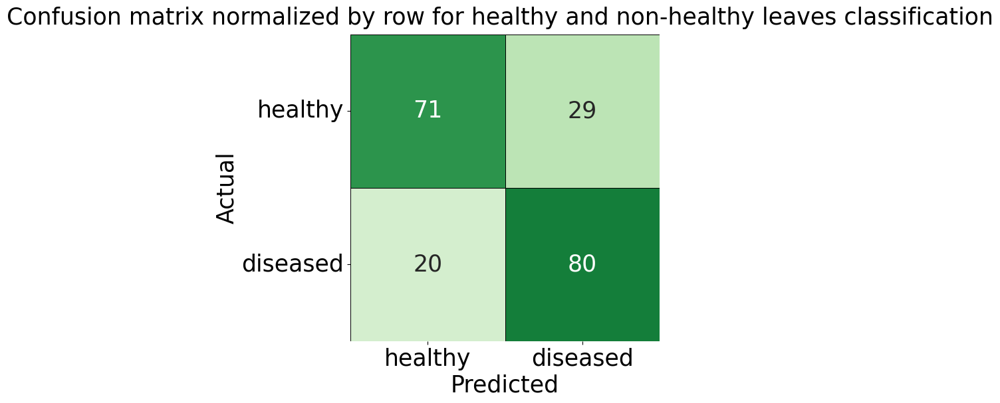

In [19]:
healthy_classification_lgb_confusion_matrix = pd.read_csv("/kaggle/working/healthy_classification/healthy_classification_lgb_confusion_matrix_over_5_skf.csv", index_col=0)
healthy_classification_confusion_matrix_normalized_by_row = healthy_classification_lgb_confusion_matrix.div(healthy_classification_lgb_confusion_matrix.sum(axis=1), axis=0) * 100
class_name = ["healthy", "diseased"]

fig, ax = plt.subplots(1, 1, figsize=(6, 6))
# mask_annotation = np.array(species_classification_normalized_by_row >= 0.009)

fig.suptitle("Confusion matrix normalized by row for healthy and non-healthy leaves classification", fontsize=25, y=0.95)

sns.heatmap(healthy_classification_confusion_matrix_normalized_by_row, annot=True, cmap='Greens', vmin=0, vmax=100,
            cbar=False, linecolor="black", linewidths=0.5, fmt=".0f", annot_kws={"fontsize":25, "rotation":0})

# for text, show_annot in zip(ax.texts, mask_annotation.ravel()):
#     text.set_visible(show_annot)
    
ax.set_yticklabels(class_name, fontsize=25, rotation=0)
ax.set_xticklabels(class_name, fontsize=25, rotation=0)
ax.set_xlabel('Predicted', fontsize=25)
ax.set_ylabel('Actual', fontsize=25)

plt.show()

fig = ax.get_figure()
fig.savefig('/kaggle/working/healthy_classification/healthy_classification_confusion_matrix_normalized_by_row_over_5_skf', bbox_inches='tight')

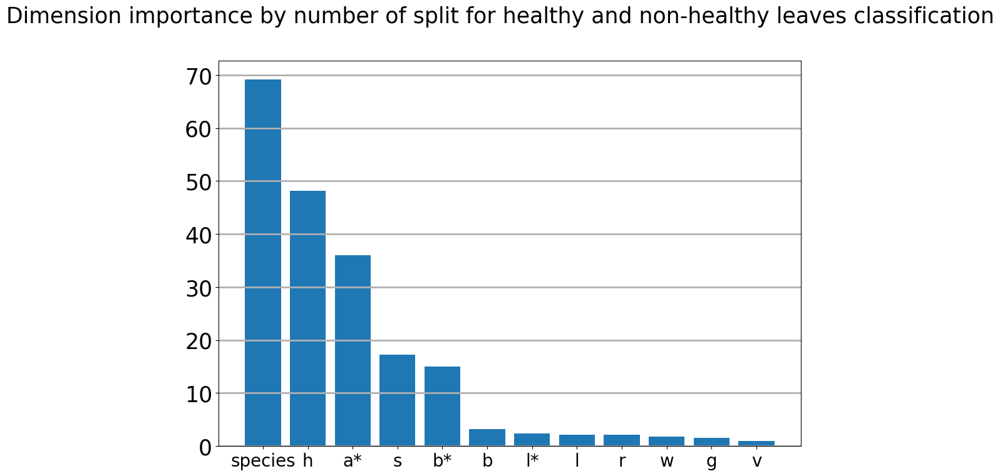

In [20]:
feature_importances_df = pd.read_csv("/kaggle/working/healthy_classification/healthy_classification_average_feature_importances_by_number_of_split_over_5_skf.csv", index_col=0)
feature_importances_df_grouped = feature_importances_df.groupby("color_space").sum().sort_values("feature_importances", ascending=False)

fig, ax = plt.subplots(figsize=(12, 8))
fig.suptitle("Dimension importance by number of split for healthy and non-healthy leaves classification", fontsize=25, y=0.99)

ax.bar(feature_importances_df_grouped["feature_importances"].index, feature_importances_df_grouped["feature_importances"])
ax.grid(visible=True, axis="y", lw=2)

ax.yaxis.set_tick_params(which='both', labelsize=25)
ax.xaxis.set_tick_params(labelsize=20, rotation=0)

plt.show()
fig = ax.get_figure()
fig.savefig('/kaggle/working/healthy_classification/healthy_classification_dimension_importance_by_number_of_split.png', bbox_inches='tight')

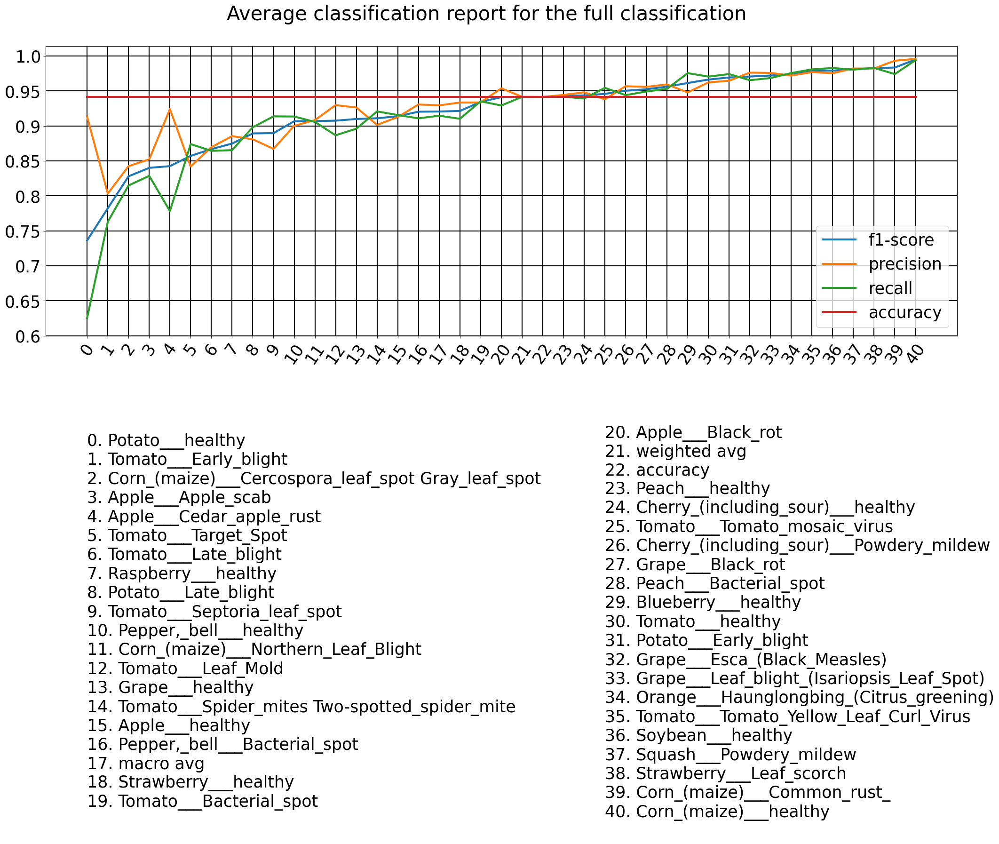

In [21]:
lgb_averaged_classification_reports_over_5_lrgbwhsvlab = pd.read_csv("/kaggle/working/full_classification/full_classification_lgb_averaged_classification_reports_over_5_skf.csv", index_col=0)
data = lgb_averaged_classification_reports_over_5_lrgbwhsvlab.sort_values(by=['f1-score'])

label_left = ""
for i, j in enumerate(data.index[:20]):
    label_left += str(i) + ". " + j + "\n"
    
label_right = ""
for i, j in enumerate(data.index[20:]):
    label_right += str(i+20) + ". " + j + "\n"

fig, ax = plt.subplots(figsize=(25, 8))
fig.suptitle("Average classification report for the full classification", fontsize=30, y=0.99)

ax.plot(range(41),data["f1-score"], label="f1-score", lw=3)
ax.plot(range(41), data["precision"], label="precision", lw=3)
ax.plot(range(41), data["recall"], label="recall", lw=3)
ax.plot(range(41), [data.loc["accuracy"][0]] * 41,label="accuracy", lw=3)

ax.legend(fontsize=25)
ax.grid(visible=True, axis='both', color="black", lw=1.5)
ax.set_xticks(range(41), range(41), fontsize=25, rotation=55)

ax.set_yticks(np.round(np.arange(0.6, 1.05, 0.05), 2), labels=np.round(np.arange(0.6, 1.05, 0.05), 2), fontsize=25)

ax.text(0, -0.1, label_left, ha='left', fontsize=25)
ax.text(25, -0.115, label_right, ha='left', fontsize=25)

ax.yaxis.set_tick_params(labelsize=25)

plt.show()

fig = ax.get_figure()
fig.savefig('/kaggle/working/full_classification/Full_classification_lgb_averaged_classification_reports_over_5_skf.png', bbox_inches='tight')

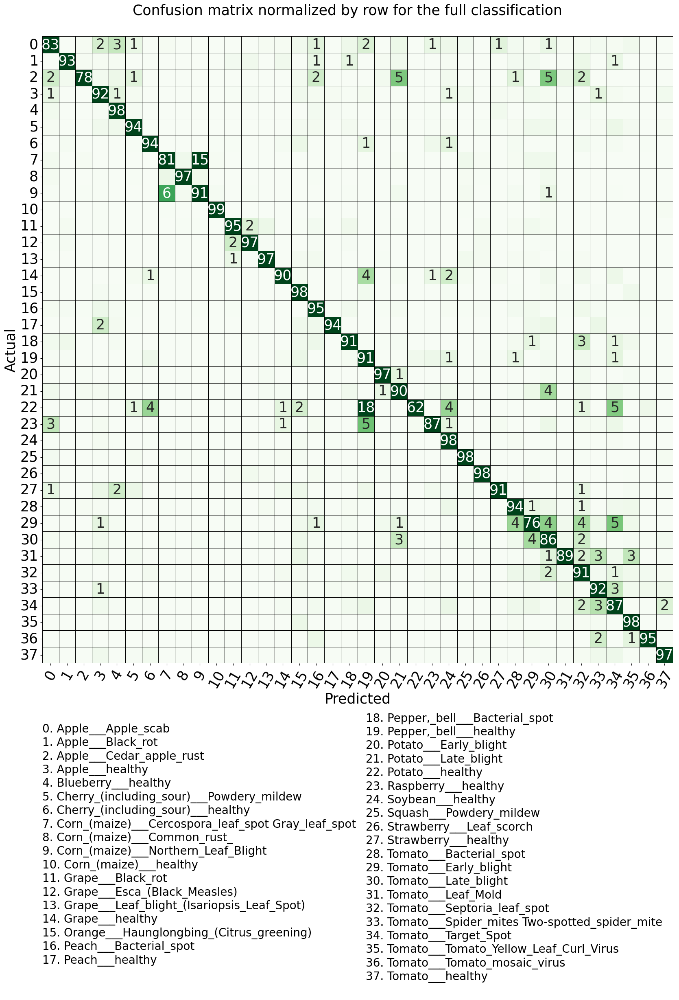

In [22]:
directories = sorted(os.listdir('/kaggle/input/plantvillage-dataset/segmented/'))
le = LabelEncoder()
le.fit(directories)
target_names = le.classes_

lgb_confusion_matrix_df = pd.read_csv("/kaggle/working/full_classification/full_classification_lgb_confusion_matrix_over_5_skf.csv", index_col=0)
lgb_confusion_matrix_normalized_by_row = lgb_confusion_matrix_df.div(lgb_confusion_matrix_df.sum(axis=1), axis=0) * 100

fig, ax = plt.subplots(1, 1, figsize=(20, 20))
mask_annotation = np.array(lgb_confusion_matrix_normalized_by_row >= 0.9)

fig.suptitle("Confusion matrix normalized by row for the full classification", fontsize=25, y=0.92)
sns.heatmap(lgb_confusion_matrix_normalized_by_row, annot=True, cmap='Greens', vmin=0, vmax=10,
            cbar=False, linecolor="black", linewidths=0.5, fmt=".0f", annot_kws={"fontsize":25, "rotation":0})#, fmt=".2f", annot_kws={"fontsize":18, "color":"red", "rotation":28}) # (0, 0.7, 0)

for text, show_annot in zip(ax.texts, mask_annotation.ravel()):
    text.set_visible(show_annot)
    
ax.set_yticklabels(range(38), fontsize=25, rotation=0)
ax.set_xticklabels(range(38), fontsize=25, rotation=60)
ax.set_xlabel('Predicted', fontsize=25)
ax.set_ylabel('Actual', fontsize=25)

label_left = ""
for i, j in enumerate(target_names[:18]):
    label_left += str(i) + ". " + j + "\n"
    
label_right = ""
for i, j in enumerate(target_names[18:]):
    label_right += str(i+18) + ". " + j + "\n"
    
ax.text(0, 57, label_left, ha='left', fontsize=20)
ax.text(19.5, 58, label_right, ha='left', fontsize=20)

plt.show()

fig = ax.get_figure()
fig.savefig('/kaggle/working/full_classification/Full_classification_confusion_matrix_normalized_by_row_over_5_skf.png', bbox_inches='tight')

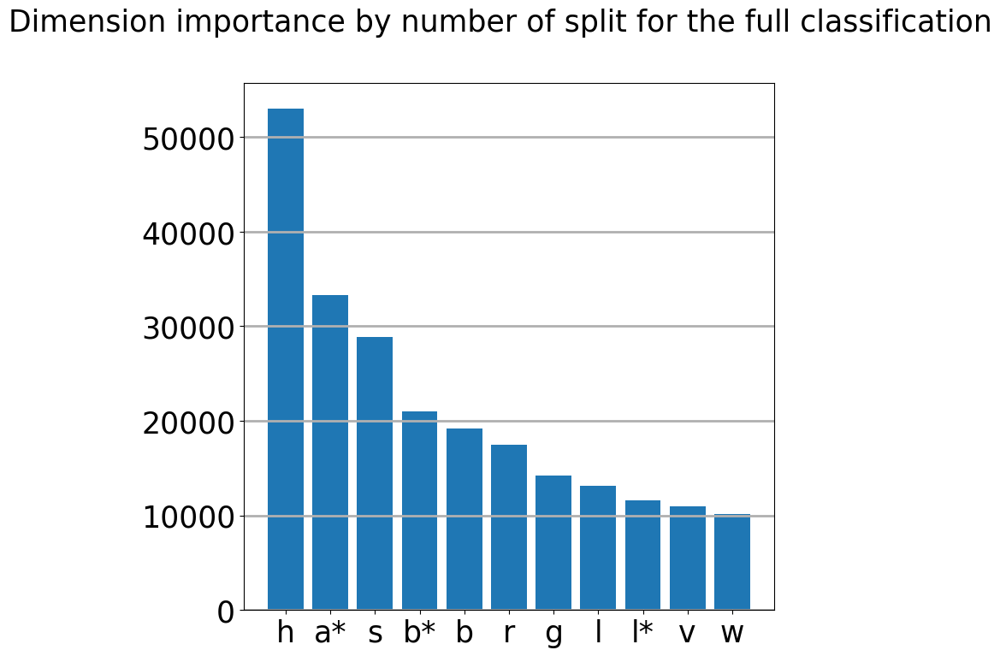

In [23]:
feature_importances_df = pd.read_csv("/kaggle/working/full_classification/full_classification_average_feature_importances_by_number_of_split_over_5_skf.csv", index_col=0)
feature_importances_df_grouped = feature_importances_df.groupby("color_space").sum().sort_values("feature_importances", ascending=False)

fig, ax = plt.subplots(figsize=(8, 8))
fig.suptitle("Dimension importance by number of split for the full classification", fontsize=25, y=0.99)

ax.bar(feature_importances_df_grouped["feature_importances"].index, feature_importances_df_grouped["feature_importances"])
ax.grid(visible=True, axis="y", lw=2)

ax.yaxis.set_tick_params(which='both', labelsize=25)
ax.xaxis.set_tick_params(labelsize=25)

plt.show()
fig = ax.get_figure()
fig.savefig('/kaggle/working/full_classification/full_classification_dimension_importance_by_number_of_split.png', bbox_inches='tight')

# Tensorflow dense neural network

In [ ]:
# Adjust weights inversely proportional to class frequencies in the input data.
total = y.shape[0]
class_weight = {}
for i, categorie_count in enumerate(y.value_counts()):
    class_weight[i] = int(total / categorie_count)
    
directories = sorted(os.listdir("/kaggle/input/plantvillage-dataset/segmented"))

pca = PCA(n_components=0.99)
X_PCA = pca.fit_transform(X)

In [ ]:
import gc
gc.collect()

In [ ]:
batch_size = 16
n_splits = 5
epochs = 1000
X = X # or X_PCA.
exp_name = "dense_neural_network_01"

skf = StratifiedKFold(n_splits=n_splits)
dnn_confusion_matrix_list = []
dnn_report_list = []

# Callbacks for early stopping and to save the best model.
earlystop = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)

checkpoint_path = f"/kaggle/working/{exp_name}/dnn_weights/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                 monitor = "val_loss",
                                                 save_best_only = True,
                                                 save_weights_only=True,
                                                 verbose=1)
callbacks = [earlystop, cp_callback]

cwd = os.getcwd()
if not os.path.exists(cwd + "/" + f"{exp_name}"):
    os.mkdir(cwd + "/" + f"{exp_name}")
else:
    print(f"Files in the {cwd}/{exp_name} directerory will be overwritten.")
    
history = []

for i, (train_index, test_index) in tqdm(enumerate(skf.split(X, y))):
    
    # The dense neural network.
    model = keras.Sequential(
        [
            layers.Dense(800, activation="relu"),
            layers.Dense(800, activation="relu"),
            layers.Dense(38)
        ]
    )

    X_train, y_train = X.iloc[train_index], y[train_index]
    X_test, y_test = X.iloc[test_index], y[test_index]

    model.compile(optimizer=tf.keras.optimizers.AdamW(),
                  loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                  metrics=['accuracy'])

    history_by_skf = model.fit(X_train, y_train, batch_size=batch_size, validation_data=(X_test, y_test),
                               epochs=epochs, callbacks=callbacks, verbose=1, class_weight=class_weight)
    
    clear_output()
    
    history.append(history_by_skf)
    
    # Load the best weights to make the predictions.
    model.load_weights(checkpoint_path)
    y_pred_proba = model.predict(X_test)
    y_pred_label = np.argmax(y_pred_proba, axis=1)
    
    # Appending the confusion matrices over the folds.
    dnn_confusion_matrix = pd.crosstab(y_test, y_pred_label, rownames=['Actual'], colnames=['Predicted'])
    dnn_confusion_matrix_list.append(dnn_confusion_matrix)

    # Appending the classification reports over the folds.
    dnn_class_report = pd.DataFrame(classification_report(y_test, y_pred_label,
                                                          target_names=directories, output_dict=True)).T
    dnn_report_list.append(dnn_class_report)

# Concatenate training histories into 1 dataframe.
df = functools.reduce(lambda x, y:  pd.concat([pd.DataFrame(x), pd.DataFrame(y)], axis=1),
                      [training_history.history for training_history in history])

df.to_csv(f"{exp_name}_training_history_{n_splits}_skf.csv")

# Average the classification reports and accumulate the confusion matrices.
dnn_averaged_classification_reports = functools.reduce(lambda x, y:  x+y, dnn_report_list) / n_splits
dnn_confusion_matrix_over_skf = functools.reduce(lambda x, y:  x+y, dnn_confusion_matrix_list)

dnn_averaged_classification_reports.to_csv(f"{exp_name}_averaged_classification_reports_over_{n_splits}_skf.csv")
dnn_confusion_matrix_over_skf.to_csv(f"{exp_name}_confusion_matrix_over_{n_splits}_skf.csv")
    
for file in os.listdir(cwd):
    if exp_name + "_" in file:
        shutil.move(os.path.join(cwd, file), os.path.join(cwd, exp_name, file))


In [ ]:
df_history = pd.read_csv(f"/kaggle/working/{exp_name}/{exp_name}_training_history_{n_splits}_skf.csv",
                         index_col=0)

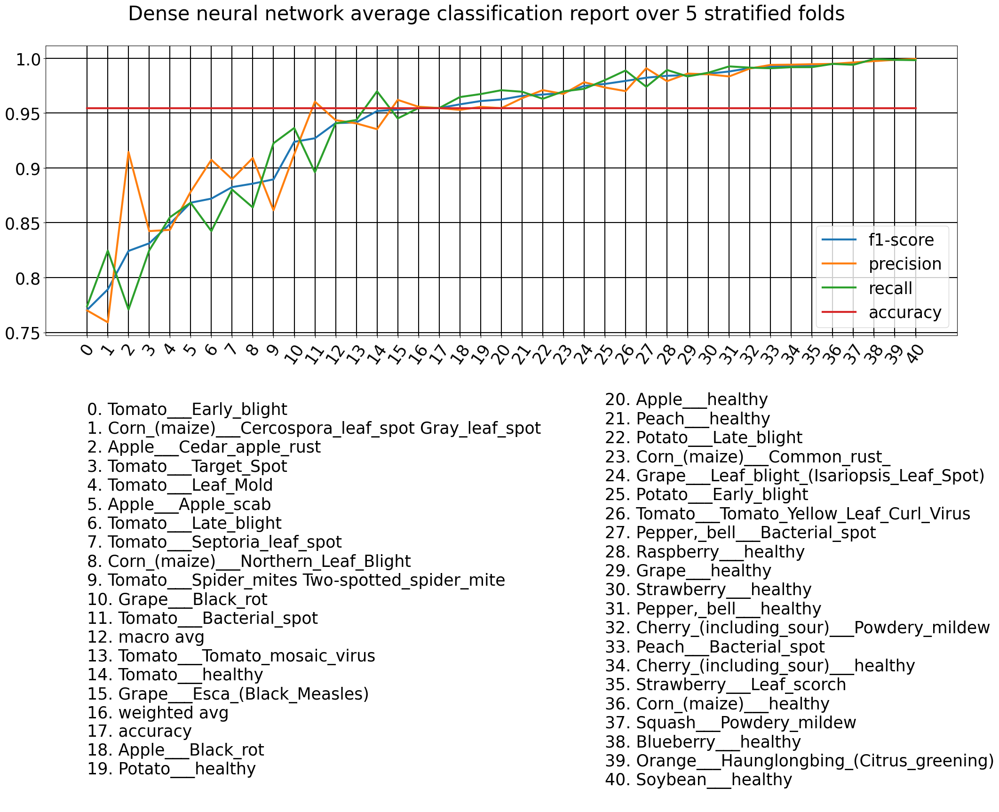

In [26]:
exp_name = "dense_neural_network_01"
n_splits = 5

dnn_averaged_classification_reports_over_5_lrgbwhsvlab = pd.read_csv(f"/kaggle/working/{exp_name}/{exp_name}_averaged_classification_reports_over_{n_splits}_skf.csv",
                                                                     index_col=0)
data = dnn_averaged_classification_reports_over_5_lrgbwhsvlab.sort_values(by=['f1-score'])

label_left = ""
for i, j in enumerate(data.index[:20]):
    label_left += str(i) + ". " + j + "\n"
    
label_right = ""
for i, j in enumerate(data.index[20:]):
    label_right += str(i+20) + ". " + j + "\n"

fig, ax = plt.subplots(figsize=(25, 8))
fig.suptitle("Dense neural network average classification report over 5 stratified folds", fontsize=30, y=0.99)

ax.plot(range(41),data["f1-score"], label="f1-score", lw=3)
ax.plot(range(41), data["precision"], label="precision", lw=3)
ax.plot(range(41), data["recall"], label="recall", lw=3)
ax.plot(range(41), [data.loc["accuracy"][0]] * 41,label="accuracy", lw=3)

ax.legend(fontsize=25)
ax.grid(visible=True, axis='both', color="black", lw=1.5)
ax.set_xticks(range(41), range(41), fontsize=25, rotation=55)

ax.set_yticks(np.round(np.arange(0.75, 1.001, 0.05), 2), labels=np.round(np.arange(0.75, 1.001, 0.05), 2), fontsize=25)

ax.text(0, 0.33, label_left, ha='left', fontsize=25)
ax.text(25, 0.32, label_right, ha='left', fontsize=25)

ax.yaxis.set_tick_params(labelsize=25)

plt.show()

fig = ax.get_figure()
fig.savefig(f'/kaggle/working/{exp_name}/{exp_name}_average_classification_report_over_{n_splits}_skf.png',
            bbox_inches='tight')

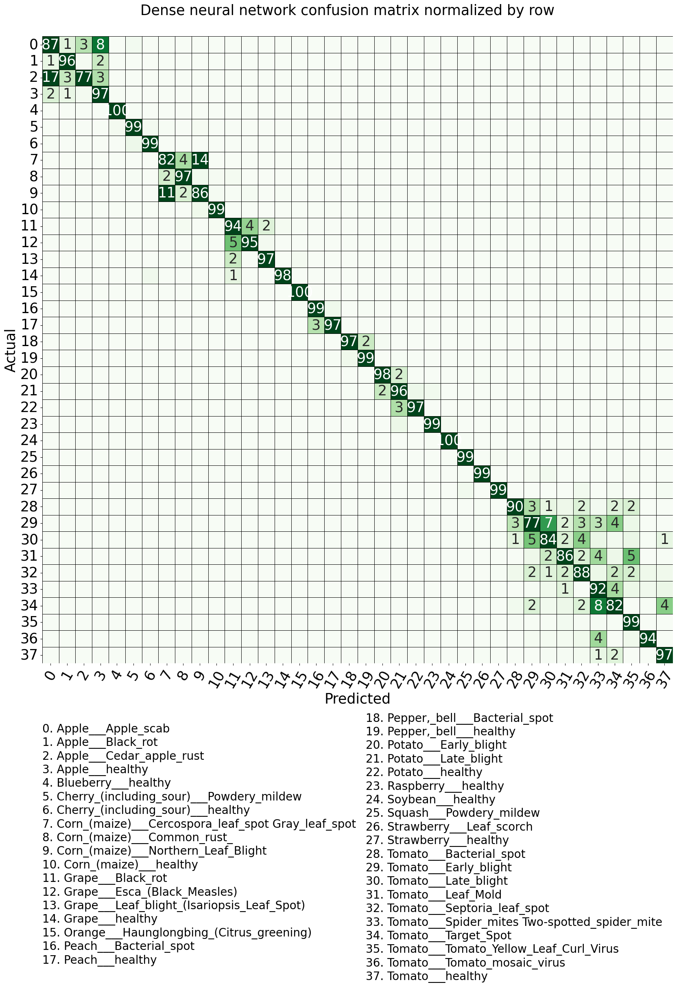

In [27]:
directories = sorted(os.listdir("/kaggle/input/plantvillage-dataset/segmented"))
dnn_confusion_matrix = pd.read_csv(f"/kaggle/working/{exp_name}/{exp_name}_confusion_matrix_over_{n_splits}_skf.csv", index_col=0)
dnn_confusion_matrix_normalized_by_row = dnn_confusion_matrix.div(dnn_confusion_matrix.sum(axis=1), axis=0) * 100

fig, ax = plt.subplots(1, 1, figsize=(20, 20))
mask_annotation = np.array(dnn_confusion_matrix_normalized_by_row >= 0.9)

fig.suptitle("Dense neural network confusion matrix normalized by row", fontsize=25, y=0.92)
sns.heatmap(dnn_confusion_matrix_normalized_by_row, annot=True, cmap='Greens', vmin=0, vmax=10,
            cbar=False, linecolor="black", linewidths=0.5, fmt=".0f", annot_kws={"fontsize":25, "rotation":0})#, fmt=".2f", annot_kws={"fontsize":18, "color":"red", "rotation":28}) # (0, 0.7, 0)

for text, show_annot in zip(ax.texts, mask_annotation.ravel()):
    text.set_visible(show_annot)
    
ax.set_yticklabels(range(38), fontsize=25, rotation=0)
ax.set_xticklabels(range(38), fontsize=25, rotation=60)
ax.set_xlabel('Predicted', fontsize=25)
ax.set_ylabel('Actual', fontsize=25)

label_left = ""
for i, j in enumerate(directories[:18]):
    label_left += str(i) + ". " + j + "\n"
    
label_right = ""
for i, j in enumerate(directories[18:]):
    label_right += str(i+18) + ". " + j + "\n"
    
ax.text(0, 57, label_left, ha='left', fontsize=20)
ax.text(19.5, 58, label_right, ha='left', fontsize=20)


plt.show()

fig = ax.get_figure()
fig.savefig(f'/kaggle/working/{exp_name}/{exp_name}_confusion_matrix_normalized_by_row.png', bbox_inches='tight')

In [ ]:
# Load the DNN weights from the working directory.
def create_model():
    
    model = keras.Sequential(
        [
            layers.Dense(800, activation="relu"),
            layers.Dense(800, activation="relu"),
            layers.Dense(38)
        ]
    )
    return model

checkpoint_path = f"/kaggle/working/{exp_name}/dnn_weights/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)

model = create_model()
model.load_weights(checkpoint_path)